In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

df = pd.read_csv('wish-website-summer-products-with-rating-and-performance_2020-08.csv')
df.head()

,title_in_french,title_translated,listed_price,retail_price,currency_buyer,units_sold,uses_ad_boosts,rating,rating_count,rating_five_count,...,merchant_rating_count,merchant_rating,merchant_id,merchant_has_profile_picture,merchant_profile_picture,product_url,product_picture,product_id,theme,crawl_month
0,2020 Summer Vintage Flamingo Print Pajamas Se...,2020 Summer Vintage Flamingo Print Pajamas Se...,16.00,14,EUR,100,0,3.76,54,26.0,...,568,4.128521,595097d6a26f6e070cb878d1,0,NaN,https://www.wish.com/c/5e9ae51d43d6a96e303acdb0,https://contestimg.wish.com/api/webimage/5e9ae...,5e9ae51d43d6a96e303acdb0,summer,2020-08
1,SSHOUSE Summer Casual Sleeveless Soirée Party ...,Women's Casual Summer Sleeveless Sexy Mini Dress,8.00,22,EUR,20000,1,3.45,6135,2269.0,...,17752,3.899673,56458aa03a698c35c9050988,0,NaN,https://www.wish.com/c/58940d436a0d3d5da4e95a38,https://contestimg.wish.com/api/webimage/58940...,58940d436a0d3d5da4e95a38,summer,2020-08
2,2020 Nouvelle Arrivée Femmes Printemps et Été ...,2020 New Arrival Women Spring and Summer Beach...,8.00,43,EUR,100,0,3.57,14,5.0,...,295,3.989831,5d464a1ffdf7bc44ee933c65,0,NaN,https://www.wish.com/c/5ea10e2c617580260d55310a,https://contestimg.wish.com/api/webimage/5ea10...,5ea10e2c617580260d55310a,summer,2020-08
3,Hot Summer Cool T-shirt pour les femmes Mode T...,Hot Summer Cool T Shirt for Women Fashion Tops...,8.00,8,EUR,5000,1,4.03,579,295.0,...,23832,4.020435,58cfdefdacb37b556efdff7c,0,NaN,https://www.wish.com/c/5cedf17ad1d44c52c59e4aca,https://contestimg.wish.com/api/webimage/5cedf...,5cedf17ad1d44c52c59e4aca,summer,2020-08
4,Femmes Shorts d'été à lacets taille élastique ...,Women Summer Shorts Lace Up Elastic Waistband ...,2.72,3,EUR,100,1,3.10,20,6.0,...,14482,4.001588,5ab3b592c3911a095ad5dadb,0,NaN,https://www.wish.com/c/5ebf5819ebac372b070b0e70,https://contestimg.wish.com/api/webimage/5ebf5...,5ebf5819ebac372b070b0e70,summer,2020-08


In [2]:
df.shape

(1573, 43)

In [3]:
from pandas_profiling import ProfileReport

profile_report = ProfileReport(df)

profile_report.to_file("Profile_Report_Wish.html")

Summarize dataset:   0%|          | 0/56 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [4]:
profile_report

In [5]:
df.isnull().sum()

title_in_french                    0
title_translated                   0
listed_price                       0
retail_price                       0
currency_buyer                     0
units_sold                         0
uses_ad_boosts                     0
rating                             0
rating_count                       0
rating_five_count                 45
rating_four_count                 45
rating_three_count                45
rating_two_count                  45
rating_one_count                  45
badges_count                       0
badge_local_product                0
badge_product_quality              0
badge_fast_shipping                0
tags                               0
product_color                     41
product_variation_size_id         14
product_variation_inventory        0
shipping_option_name               0
shipping_option_price              0
shipping_is_express                0
countries_shipped_to               0
inventory_total                    0
h

In [6]:
df.columns

Index(['title_in_french', 'title_translated', 'listed_price', 'retail_price',
       'currency_buyer', 'units_sold', 'uses_ad_boosts', 'rating',
       'rating_count', 'rating_five_count', 'rating_four_count',
       'rating_three_count', 'rating_two_count', 'rating_one_count',
       'badges_count', 'badge_local_product', 'badge_product_quality',
       'badge_fast_shipping', 'tags', 'product_color',
       'product_variation_size_id', 'product_variation_inventory',
       'shipping_option_name', 'shipping_option_price', 'shipping_is_express',
       'countries_shipped_to', 'inventory_total', 'has_urgency_banner',
       'urgency_text', 'origin_country', 'merchant_title', 'merchant_name',
       'merchant_info_subtitle', 'merchant_rating_count', 'merchant_rating',
       'merchant_id', 'merchant_has_profile_picture',
       'merchant_profile_picture', 'product_url', 'product_picture',
       'product_id', 'theme', 'crawl_month'],
      dtype='object')

In [7]:
wish_data = df[['listed_price', 'retail_price', 'units_sold', 'rating', 
                'rating_count', 'inventory_total', 'product_id']]

In [8]:
wish_data.isnull().sum()

listed_price       0
retail_price       0
units_sold         0
rating             0
rating_count       0
inventory_total    0
product_id         0
dtype: int64

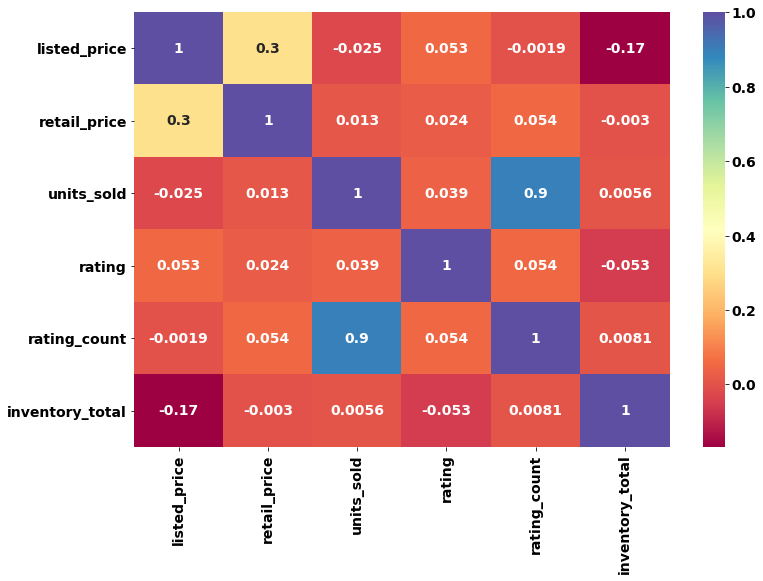

In [9]:
import seaborn as sns
plt.rcParams.update({'figure.figsize': (12.0, 8.0)})
plt.rcParams.update({'font.size': 14})


correlation = wish_data.corr()
sns.heatmap(correlation, annot = True, cmap = "Spectral")
plt.show()

In [10]:
wish_data['total_sales'] = wish_data['listed_price'] * wish_data['units_sold']

In [11]:
wish_data.head()

,listed_price,retail_price,units_sold,rating,rating_count,inventory_total,product_id,total_sales
0,16.00,14,100,3.76,54,50,5e9ae51d43d6a96e303acdb0,1600.0
1,8.00,22,20000,3.45,6135,50,58940d436a0d3d5da4e95a38,160000.0
2,8.00,43,100,3.57,14,50,5ea10e2c617580260d55310a,800.0
3,8.00,8,5000,4.03,579,50,5cedf17ad1d44c52c59e4aca,40000.0
4,2.72,3,100,3.10,20,50,5ebf5819ebac372b070b0e70,272.0


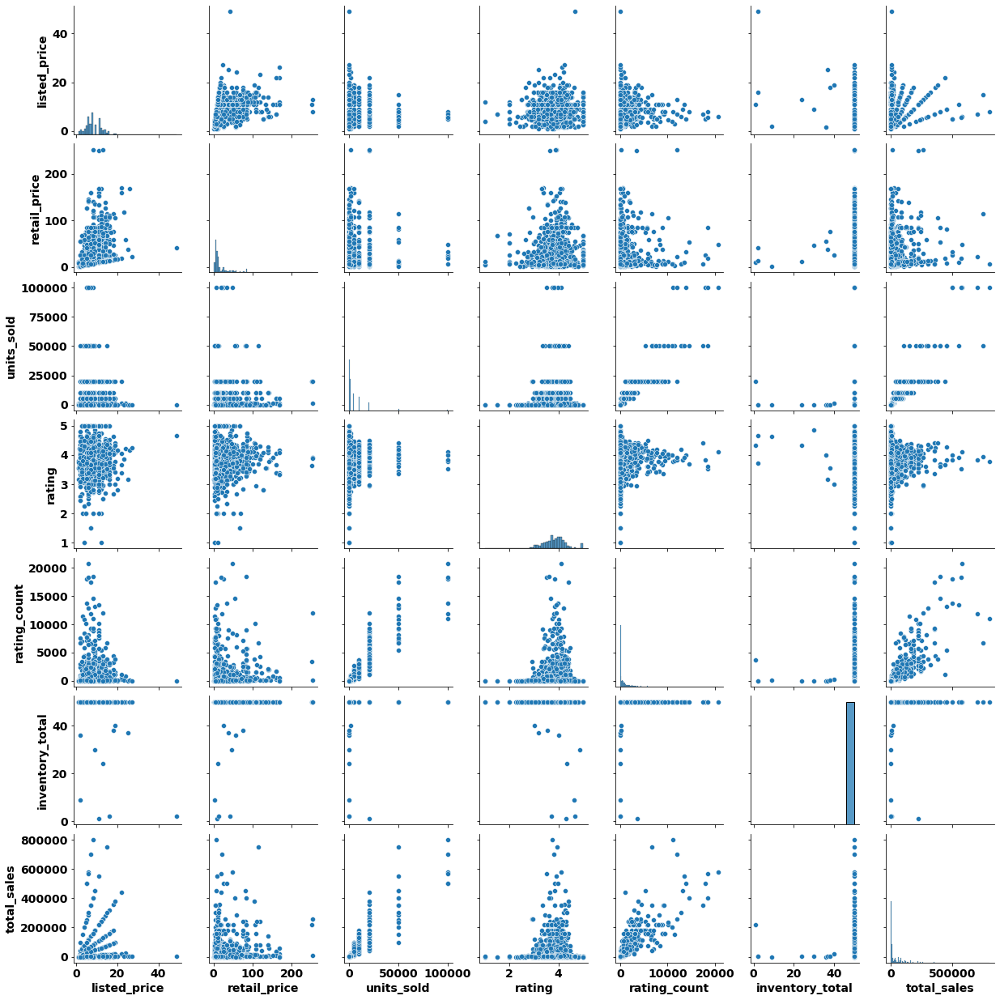

In [12]:
sns.pairplot(data = wish_data)
plt.show()

In [13]:
from pycaret.regression import * 

exp_reg = setup(data = wish_data, target = 'total_sales', numeric_features = ['units_sold', 'inventory_total'])

,Description,Value
0,session_id,2563
1,Target,total_sales
2,Original Data,"(1573, 8)"
3,Missing Values,False
4,Numeric Features,6
5,Categorical Features,1
6,Ordinal Features,False
7,High Cardinality Features,False
8,High Cardinality Method,None
9,Transformed Train Set,"(1101, 986)"


In [14]:
best = compare_models()

,Model,MAE,MSE,RMSE,R2,RMSLE,MAPE,TT (Sec)
rf,Random Forest Regressor,2028.0144,269991915.3274,12174.7219,0.9599,0.1098,0.0374,0.2050
gbr,Gradient Boosting Regressor,3501.1987,254322369.8527,12979.4996,0.9573,0.8328,1.7385,0.2250
et,Extra Trees Regressor,1740.1564,264947135.0593,12381.3817,0.9541,0.0823,0.0243,0.3260
xgboost,Extreme Gradient Boosting,1901.1999,227686593.2750,12067.6114,0.9529,0.1621,0.0650,0.7080
catboost,CatBoost Regressor,2857.1988,351398833.7952,13353.3751,0.9500,0.6081,0.5969,2.6270
dt,Decision Tree Regressor,2177.7202,359458789.0080,16036.9428,0.9214,0.1054,0.0295,0.0220
ada,AdaBoost Regressor,14436.5145,592397150.5686,23322.0598,0.8670,2.1637,19.9270,0.2610
lightgbm,Light Gradient Boosting Machine,6146.9108,825905203.3296,25870.1077,0.8341,0.6103,0.7500,0.0890
lasso,Lasso Regression,10242.8946,958474844.8000,29304.7242,0.7626,1.1612,3.4049,0.2730
lr,Linear Regression,13208.7683,1015474172.8000,29610.9805,0.7618,1.6572,11.5311,0.2640


In [15]:
et = create_model('et')

,MAE,MSE,RMSE,R2,RMSLE,MAPE
0,1650.6846,190792009.1517,13812.7481,0.9562,0.1279,0.0369
1,1240.7395,136695682.7437,11691.6929,0.9699,0.0852,0.0192
2,5602.8130,1502323033.6556,38759.8121,0.8515,0.1607,0.0530
3,3069.4653,579636063.0046,24075.6321,0.8738,0.1066,0.0256
4,1412.1940,43337598.7320,6583.1299,0.9936,0.0869,0.0283
5,342.3621,6432750.8763,2536.2868,0.9985,0.0331,0.0090
6,1105.3236,31463963.8348,5609.2748,0.9915,0.0390,0.0122
7,1022.5048,49958451.6916,7068.1293,0.9808,0.0328,0.0087
8,765.5515,16586744.3450,4072.6827,0.9955,0.0227,0.0082
9,1189.9261,92245052.5576,9604.4288,0.9299,0.1282,0.0419


In [19]:
evaluate_model(et)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…